# 91 — QC individual nodal gathers and picks

This notebook is the QC follow-on to `90_detect_pick_extract_individual_nodal_gathers.ipynb`.

It assumes `90_*` has already produced:

- `lbssp_shot_catalog.sqlite`
- individual full-node nodal gather MiniSEED files
- individual component SEG-Y files if enabled
- `trace_index`
- `picks`
- `shot_gather_files`
- `receiver_geometry`

This notebook does **not** attempt Geode matching or stacking. Zero Geode matches are expected at this stage.

## 1. Configuration

In [1]:
from pathlib import Path
import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from obspy import read

PROJECT_ROOT = Path("/Volumes/tachyon/LBSSP_DATA")
CATALOG_DB = PROJECT_ROOT / "catalog" / "lbssp_shot_catalog.sqlite"

# If 90_* wrote a run-specific output root, this is only used for exports/QC figures.
QC_OUT = PROJECT_ROOT / "nodal_fullnode_shotgathers_v4" / "qc_exports"
QC_OUT.mkdir(parents=True, exist_ok=True)

print("CATALOG_DB:", CATALOG_DB)
print("Exists:", CATALOG_DB.exists())
print("QC_OUT:", QC_OUT)

CATALOG_DB: /Volumes/tachyon/LBSSP_DATA/catalog/lbssp_shot_catalog.sqlite
Exists: True
QC_OUT: /Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/qc_exports


## 2. Open catalog and list tables

In [2]:
conn = sqlite3.connect(CATALOG_DB)

tables = pd.read_sql("""
    SELECT name
    FROM sqlite_master
    WHERE type='table'
    ORDER BY name
""", conn)

display(tables)

required_tables = [
    "processing_runs",
    "shot_events",
    "receiver_geometry",
    "shot_gather_files",
    "trace_index",
    "picks",
]

missing = [t for t in required_tables if t not in set(tables["name"])]
if missing:
    raise RuntimeError(f"Missing required catalog tables: {missing}")

,name
0,picks
1,processing_errors
2,processing_runs
3,receiver_geometry
4,shot_events
5,shot_gather_files
6,trace_index


## 3. Load core tables

In [3]:
processing_runs = pd.read_sql("SELECT * FROM processing_runs", conn)
shot_events = pd.read_sql("SELECT * FROM shot_events", conn)
receiver_geometry = pd.read_sql("SELECT * FROM receiver_geometry", conn)
shot_gather_files = pd.read_sql("SELECT * FROM shot_gather_files", conn)
trace_index = pd.read_sql("SELECT * FROM trace_index", conn)
picks = pd.read_sql("SELECT * FROM picks", conn)

print("processing_runs:", len(processing_runs))
print("shot_events:", len(shot_events))
print("receiver_geometry:", len(receiver_geometry))
print("shot_gather_files:", len(shot_gather_files))
print("trace_index:", len(trace_index))
print("picks:", len(picks))

display(processing_runs.tail())

processing_runs: 1
shot_events: 3436
receiver_geometry: 245
shot_gather_files: 3436
trace_index: 338580
picks: 790020


,run_id,notebook_name,run_time_utc,input_sds_root,output_root,parameters_json,notes,input_metadata_xlsx,input_geode_file_times_csv,catalog_db
0,20260617T230552Z_da97ed5d,90_nodal_fullnode_detection_pick_and_shotgathe...,2026-06-17T23:05:52.363740+00:00,/Volumes/tachyon/LBSSP_DATA/nodal_sds_position...,/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_sho...,"{\n ""SDS_ROOT"": ""/Volumes/tachyon/LBSSP_DATA/...",Full-node nodal shot-gather factory; DPZ detec...,None,None,/Volumes/tachyon/LBSSP_DATA/catalog/lbssp_shot...


## 4. Normalize time columns

`90_*` versions have used slightly different names. This section creates `event_time_dt` from the best available detection/on/off time column. It does not try to infer Geode times.

In [4]:
def first_existing_col(df, candidates):
    for c in candidates:
        if c in df.columns:
            return c
    return None

event_time_col = first_existing_col(
    shot_events,
    ["detection_time_utc", "on_time_utc", "event_time_utc", "shot_time_utc", "starttime"],
)

print("Using event time column:", event_time_col)

if event_time_col is None:
    raise RuntimeError(f"No usable time column found in shot_events. Columns: {list(shot_events.columns)}")

shot_events["event_time_dt"] = pd.to_datetime(
    shot_events[event_time_col],
    errors="coerce",
    utc=True,
)

print(shot_events["event_time_dt"].notna().value_counts(dropna=False))
display(shot_events[["event_id", "timewindow_label", event_time_col, "event_time_dt"]].head())

Using event time column: detection_time_utc
event_time_dt
True    3436
Name: count, dtype: int64


,event_id,timewindow_label,detection_time_utc,event_time_dt
0,T1_N1_Streamer_T1_N1_E00001,T1_N1_Streamer,2026-05-16T17:13:01.890000Z,2026-05-16 17:13:01.890000+00:00
1,T1_N1_Streamer_T1_N1_E00002,T1_N1_Streamer,2026-05-16T17:13:14.824000Z,2026-05-16 17:13:14.824000+00:00
2,T1_N1_Streamer_T1_N1_E00003,T1_N1_Streamer,2026-05-16T17:13:28.030000Z,2026-05-16 17:13:28.030000+00:00
3,T1_N1_Streamer_T1_N1_E00004,T1_N1_Streamer,2026-05-16T17:13:30.858000Z,2026-05-16 17:13:30.858000+00:00
4,T1_N1_Streamer_T1_N1_E00005,T1_N1_Streamer,2026-05-16T17:13:33.392000Z,2026-05-16 17:13:33.392000+00:00


## 5. Event counts and time ranges

In [5]:
agg_dict = {
    "n_events": ("event_id", "count"),
    "first_detection": ("event_time_dt", "min"),
    "last_detection": ("event_time_dt", "max"),
}

if "n_receivers_extracted" in shot_events.columns:
    agg_dict.update({
        "n_receivers_mean": ("n_receivers_extracted", "mean"),
        "n_receivers_min": ("n_receivers_extracted", "min"),
        "n_receivers_max": ("n_receivers_extracted", "max"),
    })

event_summary = (
    shot_events
    .groupby("timewindow_label", dropna=False)
    .agg(**agg_dict)
    .reset_index()
)

display(event_summary)
event_summary.to_csv(QC_OUT / "event_summary_by_timewindow.csv", index=False)

,timewindow_label,n_events,first_detection,last_detection,n_receivers_mean,n_receivers_min,n_receivers_max
0,T1_N1_Streamer,532,2026-05-16 17:13:01.890000+00:00,2026-05-16 21:44:03.302000+00:00,30.308271,15,35
1,T1_N2_Nodal1,1376,2026-05-17 16:19:34.132000+00:00,2026-05-17 18:59:59.388000+00:00,32.166424,26,35
2,T1_N2_Nodal2,81,2026-05-19 13:07:40.072000+00:00,2026-05-19 13:15:26.874000+00:00,34.000000,34,34
3,T1_N2_Refraction1m,431,2026-05-18 16:07:22.442000+00:00,2026-05-18 18:38:21.774000+00:00,34.000000,34,34
4,T1_N2_Refraction2m,450,2026-05-18 20:17:03.646000+00:00,2026-05-18 23:13:08.346000+00:00,34.000000,34,34
5,T1_N3_Nodal3,43,2026-05-19 14:00:18.624000+00:00,2026-05-19 14:03:18.740000+00:00,34.000000,34,34
6,T3_N4_Refraction1am,523,2026-05-19 16:02:33.030000+00:00,2026-05-19 18:22:04.542000+00:00,35.000000,35,35


## 6. Receiver geometry QC

In [6]:
geom_summary = (
    receiver_geometry
    .groupby(["geometry_id", "line", "network", "location"], dropna=False)
    .agg(
        n_stations=("station", "nunique"),
        min_x_m=("receiver_x_m", "min"),
        max_x_m=("receiver_x_m", "max"),
        sample_rate_hz=("sample_rate_hz", "first"),
    )
    .reset_index()
    .sort_values(["line", "geometry_id"])
)

display(geom_summary)
geom_summary.to_csv(QC_OUT / "receiver_geometry_summary.csv", index=False)

for gid, sub in receiver_geometry.groupby("geometry_id"):
    sub = sub.sort_values("receiver_x_m")
    print(f"\n{gid}: {sub['station'].nunique()} stations")
    print(list(sub["station"].astype(str)))

,geometry_id,line,network,location,n_stations,min_x_m,max_x_m,sample_rate_hz
0,T1_N1_Streamer_T1_N1_DPall,T1,T1,N1,35,28.00,216.00,500.0
1,T1_N2_Nodal1_T1_N2_DPall,T1,T1,N2,35,68.09,184.05,500.0
2,T1_N2_Nodal2_T1_N2_DPall,T1,T1,N2,35,68.09,184.05,500.0
3,T1_N2_Refraction1m_T1_N2_DPall,T1,T1,N2,35,68.09,184.05,500.0
4,T1_N2_Refraction2m_T1_N2_DPall,T1,T1,N2,35,68.09,184.05,500.0
5,T1_N3_Nodal3_T1_N3_DPall,T1,T1,N3,35,28.00,216.00,500.0
6,T3_N4_Refraction1am_T3_N4_DPall,T3,T3,N4,35,0.50,68.50,500.0



T1_N1_Streamer_T1_N1_DPall: 35 stations
['02800', '03600', '04400', '05207', '06004', '06809', '07600', '08003', '08405', '08808', '09210', '09605', '10000', '10398', '10800', '11202', '11600', '12005', '12402', '12801', '13202', '13605', '14000', '14400', '14800', '15195', '16000', '16400', '16809', '17604', '18405', '19200', '20000', '20800', '21600']

T1_N2_Nodal1_T1_N2_DPall: 35 stations
['06809', '07600', '08003', '08405', '08808', '09210', '09605', '10000', '10408', '10603', '10814', '11005', '11215', '11400', '11611', '11797', '12018', '12204', '12413', '12638', '12815', '12996', '13216', '13402', '13620', '13782', '14000', '14400', '14800', '15195', '16000', '16400', '16809', '17604', '18405']

T1_N2_Nodal2_T1_N2_DPall: 35 stations
['06809', '07600', '08003', '08405', '08808', '09210', '09605', '10000', '10408', '10603', '10814', '11005', '11215', '11400', '11611', '11797', '12018', '12204', '12413', '12638', '12815', '12996', '13216', '13402', '13620', '13782', '14000', '1440

## 7. Gather-file existence and counts

In [7]:
shot_gather_files["exists"] = shot_gather_files["file_path"].apply(lambda p: Path(str(p)).exists())

file_summary = (
    shot_gather_files
    .groupby(["timewindow_label", "file_type", "component"], dropna=False)
    .agg(
        n_files=("file_path", "count"),
        n_existing=("exists", "sum"),
        n_missing=("exists", lambda x: (~x).sum()),
    )
    .reset_index()
)

display(file_summary)
file_summary.to_csv(QC_OUT / "shot_gather_file_summary.csv", index=False)

missing_files = shot_gather_files[~shot_gather_files["exists"]].copy()
print("Missing files:", len(missing_files))
display(missing_files.head())
missing_files.to_csv(QC_OUT / "missing_shot_gather_files.csv", index=False)

,timewindow_label,file_type,component,n_files,n_existing,n_missing
0,T1_N1_Streamer,mseed,3C,532,532,0
1,T1_N2_Nodal1,mseed,3C,1376,1376,0
2,T1_N2_Nodal2,mseed,3C,81,81,0
3,T1_N2_Refraction1m,mseed,3C,431,431,0
4,T1_N2_Refraction2m,mseed,3C,450,450,0
5,T1_N3_Nodal3,mseed,3C,43,43,0
6,T3_N4_Refraction1am,mseed,3C,523,523,0


Missing files: 0


,gather_file_id,event_id,gather_id,instrument_system,line,transect,survey,component,file_type,file_path,...,duration_s,processing_level,geometry_id,run_id,network,location,timewindow_label,pre_s,post_s,exists


## 8. Trace index QC

In [8]:
trace_index_count_col = "trace_index" if "trace_index" in trace_index.columns else "station"

trace_event_summary = (
    trace_index
    .groupby("event_id", dropna=False)
    .agg(
        n_traces=(trace_index_count_col, "count"),
        n_stations=("station", "nunique"),
        min_receiver_x_m=("receiver_x_m", "min"),
        max_receiver_x_m=("receiver_x_m", "max"),
    )
    .reset_index()
)

trace_event_summary = trace_event_summary.merge(
    shot_events[["event_id", "timewindow_label", "event_time_dt"]],
    on="event_id",
    how="left",
)

display(trace_event_summary["n_stations"].describe())
display(trace_event_summary.groupby("timewindow_label")["n_stations"].describe())

trace_event_summary.to_csv(QC_OUT / "trace_counts_by_event.csv", index=False)

count    3436.000000
mean       32.846333
std         3.896733
min        15.000000
25%        33.000000
50%        34.000000
75%        35.000000
max        35.000000
Name: n_stations, dtype: float64

,count,mean,std,min,25%,50%,75%,max
timewindow_label,,,,,,,,
T1_N1_Streamer,532.0,30.308271,7.962180,15.0,20.0,35.0,35.0,35.0
T1_N2_Nodal1,1376.0,32.166424,2.785533,26.0,32.0,33.0,34.0,35.0
T1_N2_Nodal2,81.0,34.000000,0.000000,34.0,34.0,34.0,34.0,34.0
T1_N2_Refraction1m,431.0,34.000000,0.000000,34.0,34.0,34.0,34.0,34.0
T1_N2_Refraction2m,450.0,34.000000,0.000000,34.0,34.0,34.0,34.0,34.0
T1_N3_Nodal3,43.0,34.000000,0.000000,34.0,34.0,34.0,34.0,34.0
T3_N4_Refraction1am,523.0,35.000000,0.000000,35.0,35.0,35.0,35.0,35.0


## 9. Pick QC

In [9]:
# Ensure picks has timewindow_label for summaries.
if "timewindow_label" not in picks.columns:
    picks = picks.merge(
        shot_events[["event_id", "timewindow_label"]],
        on="event_id",
        how="left",
    )

# Some catalogs may use alternate naming.
if "pick_quality" not in picks.columns:
    if "quality" in picks.columns:
        picks["pick_quality"] = picks["quality"]
    else:
        picks["pick_quality"] = "unknown"

if "picker" not in picks.columns:
    picks["picker"] = "unknown"

group_cols = [c for c in ["timewindow_label", "picker", "pick_quality"] if c in picks.columns]

pick_summary = (
    picks
    .groupby(group_cols, dropna=False)
    .size()
    .reset_index(name="n")
    .sort_values(group_cols)
)

display(pick_summary)
pick_summary.to_csv(QC_OUT / "pick_summary.csv", index=False)

consensus = picks[picks["picker"].astype(str).eq("consensus")].copy()

if len(consensus):
    consensus_by_event = (
        consensus
        .groupby("event_id")
        .agg(
            n_consensus=("pick_quality", lambda x: (x.astype(str) == "consensus").sum()),
            n_failed=("pick_quality", lambda x: (x.astype(str) == "failed").sum()),
            n_total=("pick_quality", "count"),
        )
        .reset_index()
    )
    consensus_by_event = consensus_by_event.merge(
        shot_events[["event_id", "timewindow_label", "event_time_dt"]],
        on="event_id",
        how="left",
    )
    display(consensus_by_event.groupby("timewindow_label")[["n_consensus", "n_failed", "n_total"]].describe())
    consensus_by_event.to_csv(QC_OUT / "consensus_picks_by_event.csv", index=False)
else:
    print("No consensus picks found.")

,timewindow_label,picker,pick_quality,n
0,T1_N1_Streamer,aic,candidate,48372
1,T1_N1_Streamer,baer,candidate,48372
2,T1_N1_Streamer,consensus,consensus,12755
3,T1_N1_Streamer,consensus,failed,3369
4,T1_N2_Nodal1,aic,candidate,132783
5,T1_N2_Nodal1,baer,candidate,132783
6,T1_N2_Nodal1,consensus,consensus,28727
7,T1_N2_Nodal1,consensus,failed,15534
8,T1_N2_Nodal2,aic,candidate,8262
9,T1_N2_Nodal2,baer,candidate,8262


n_consensus                                               \
                          count       mean       std   min   25%   50%   75%   
timewindow_label                                                               
T1_N1_Streamer            532.0  23.975564  9.425562   4.0  15.0  28.0  32.0   
T1_N2_Nodal1             1376.0  20.877180  5.864050   6.0  17.0  20.0  24.0   
T1_N2_Nodal2               81.0  18.432099  4.168148  10.0  17.0  18.0  19.0   
T1_N2_Refraction1m        431.0  27.222738  7.024313   7.0  21.0  31.0  33.0   
T1_N2_Refraction2m        450.0  25.464444  6.243737   5.0  21.0  27.0  31.0   
T1_N3_Nodal3               43.0  17.744186  1.928397  13.0  16.5  18.0  19.0   
T3_N4_Refraction1am       523.0  27.242830  7.194900   4.0  22.5  30.0  33.0   

                          n_failed             ...              n_total  \
                      max    count       mean  ...    75%   max   count   
timewindow_label                               ...                        
T1_N1_Streamer       35.0    532.0   6.332707  ...   8.25  26.0   532.0   
T1_N2_Nodal1         34.0   1376.0  11.289244  ...  15.00  27.0  1376.0   
T1_N2_Nodal2         33.0     81.0  15.567901  ...  17.00  24.0    81.0   
T1_N2_Refraction1m   34.0    431.0   6.777262  ...  13.00  27.0   431.0   
T1_N2_Refraction2m   34.0    450.0   8.535556  ...  13.00  29.0   450.0   
T1_N3_Nodal3         22.0     43.0  16.255814  ...  17.50  21.0    43.0   
T3_N4_Refraction1am  35.0    523.0   7.757170  ...  12.50  31.0   523.0   

                                                                        
                          mean       std   min   25%   50%   75%   max  
timewindow_label                                                        
T1_N1_Streamer       30.308271  7.962180  15.0  20.0  35.0  35.0  35.0  
T1_N2_Nodal1         32.166424  2.785533  26.0  32.0  33.0  34.0  35.0  
T1_N2_Nodal2         34.000000  0.000000  34.0  34.0  34.0  34.0  34.0  
T1_N2_Refraction1m   34.000000  0.000000  34.0  34.0  34.0  34.0  34.0  
T1_N2_Refraction2m   34.000000  0.000000  34.0  34.0  34.0  34.0  34.0  
T1_N3_Nodal3         34.000000  0.000000  34.0  34.0  34.0  34.0  34.0  
T3_N4_Refraction1am  35.000000  0.000000  35.0  35.0  35.0  35.0  35.0  

[7 rows x 24 columns]

## 10. First-pick times as event-time fallback

This is useful for later notebooks. It does not alter the database; it just exports a QC table.

In [10]:
def pick_time_column(df):
    for c in ["pick_time_utc", "pick_time", "arrival_time_utc", "absolute_pick_time_utc"]:
        if c in df.columns:
            return c
    return None

pt_col = pick_time_column(picks)
print("Pick time column:", pt_col)

if pt_col is not None:
    picks["_pick_dt"] = pd.to_datetime(picks[pt_col], errors="coerce", utc=True)
    first_pick_by_event = (
        picks
        .dropna(subset=["_pick_dt"])
        .groupby("event_id")
        .agg(first_pick_time_utc=("_pick_dt", "min"))
        .reset_index()
    )
    first_pick_by_event = first_pick_by_event.merge(
        shot_events[["event_id", "timewindow_label", "event_time_dt"]],
        on="event_id",
        how="left",
    )
    first_pick_by_event["first_pick_minus_detection_s"] = (
        first_pick_by_event["first_pick_time_utc"] - first_pick_by_event["event_time_dt"]
    ).dt.total_seconds()
    display(first_pick_by_event.groupby("timewindow_label")["first_pick_minus_detection_s"].describe())
    first_pick_by_event.to_csv(QC_OUT / "first_pick_times_by_event.csv", index=False)
else:
    print("No absolute pick-time column found.")

Pick time column: pick_time_utc


,count,mean,std,min,25%,50%,75%,max
timewindow_label,,,,,,,,
T1_N1_Streamer,532.0,-0.079759,0.008419,-0.098000,-0.07600,-0.076000,-0.076,-0.068000
T1_N2_Nodal1,1376.0,-0.083666,0.010369,-0.098000,-0.09800,-0.076000,-0.076,-0.070000
T1_N2_Nodal2,81.0,-0.083160,0.008780,-0.098000,-0.09200,-0.076000,-0.076,-0.076000
T1_N2_Refraction1m,431.0,-0.082696,0.009149,-0.098000,-0.09200,-0.076000,-0.076,-0.072000
T1_N2_Refraction2m,450.0,-0.081809,0.008972,-0.098000,-0.08800,-0.076000,-0.076,-0.074000
T1_N3_Nodal3,43.0,-0.081163,0.008577,-0.098000,-0.08300,-0.076000,-0.076,-0.076000
T3_N4_Refraction1am,523.0,-0.078356,0.006482,-0.098656,-0.07647,-0.076284,-0.076,-0.075362


## 11. RefraPy export readiness

RefraPy mainly needs SEG-Y shot gathers and first-break picks with source/receiver geometry. At this stage source positions may not yet be assigned to all nodal events. That is expected before the Geode/nodal stack matching notebooks.

In [11]:
segy_files = shot_gather_files[
    shot_gather_files["file_type"].astype(str).str.lower().isin(["segy", "sgy"])
].copy()

mseed_files = shot_gather_files[
    shot_gather_files["file_type"].astype(str).str.lower().eq("mseed")
].copy()

print("SEG-Y files:", len(segy_files))
print("MiniSEED files:", len(mseed_files))

print("Pick columns:")
print(list(picks.columns))

if "source_x_m" in shot_events.columns:
    sx = pd.to_numeric(shot_events["source_x_m"], errors="coerce")
    print("Events with source_x_m:", int(sx.notna().sum()), "of", len(shot_events))
else:
    print("No source_x_m column in shot_events.")

if "picker" in picks.columns and "pick_quality" in picks.columns:
    n_consensus_good = int(((picks["picker"].astype(str) == "consensus") &
                            (picks["pick_quality"].astype(str) == "consensus")).sum())
else:
    n_consensus_good = 0

n_source_x = int(pd.to_numeric(shot_events.get("source_x_m", pd.Series(dtype=float)), errors="coerce").notna().sum()) if "source_x_m" in shot_events.columns else 0

refapy_readiness = pd.DataFrame({
    "item": [
        "individual_nodal_events",
        "mseed_gathers",
        "segy_gathers",
        "events_with_source_x_m",
        "consensus_pick_rows",
    ],
    "count": [
        len(shot_events),
        len(mseed_files),
        len(segy_files),
        n_source_x,
        n_consensus_good,
    ],
})

display(refapy_readiness)
refapy_readiness.to_csv(QC_OUT / "refapy_readiness_summary.csv", index=False)

SEG-Y files: 0
MiniSEED files: 3436
Pick columns:
['run_id', 'event_id', 'gather_id', 'instrument_system', 'network', 'station', 'location', 'channel', 'component', 'receiver_x_m', 'source_x_m', 'offset_m', 'pick_time_utc', 'pick_time_relative_s', 'phase', 'picker', 'pick_quality', 'snr', 'details_json', 'timewindow_label', '_pick_dt']
Events with source_x_m: 524 of 3436


,item,count
0,individual_nodal_events,3436
1,mseed_gathers,3436
2,segy_gathers,0
3,events_with_source_x_m,524
4,consensus_pick_rows,81178


## 12. Quick-look: event count through time

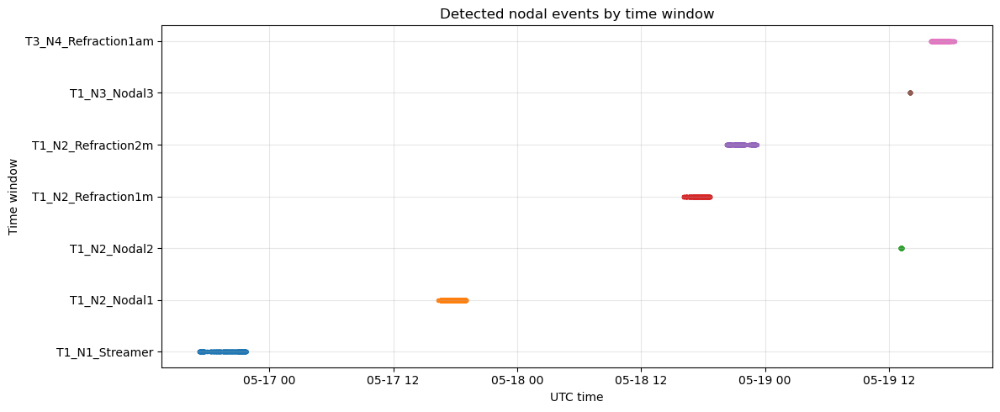

In [12]:
plot_df = shot_events.dropna(subset=["event_time_dt"]).copy()

fig, ax = plt.subplots(figsize=(12, 5))

for label, sub in plot_df.groupby("timewindow_label"):
    ax.scatter(sub["event_time_dt"], np.full(len(sub), label), s=8, label=label)

ax.set_xlabel("UTC time")
ax.set_ylabel("Time window")
ax.set_title("Detected nodal events by time window")
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## 13. Quick-look: receiver counts through time

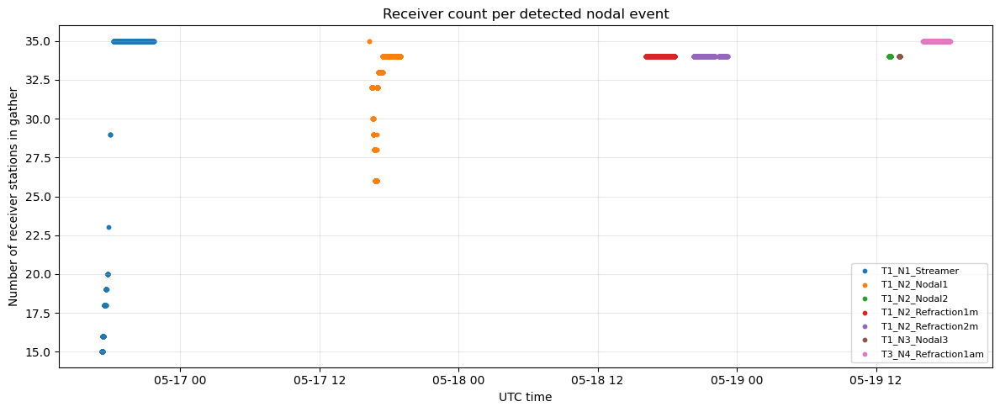

In [13]:
plot_df = trace_event_summary.dropna(subset=["event_time_dt"]).copy()

fig, ax = plt.subplots(figsize=(12, 5))

for label, sub in plot_df.groupby("timewindow_label"):
    ax.scatter(sub["event_time_dt"], sub["n_stations"], s=10, label=label)

ax.set_xlabel("UTC time")
ax.set_ylabel("Number of receiver stations in gather")
ax.set_title("Receiver count per detected nodal event")
ax.grid(True, alpha=0.3)
ax.legend(loc="best", fontsize=8)
plt.tight_layout()
plt.show()

## 14. Load and plot example gathers

,event_id,timewindow_label,file_path
0,T1_N1_Streamer_T1_N1_E00001,T1_N1_Streamer,/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_sho...
532,T1_N2_Nodal1_T1_N2_E00001,T1_N2_Nodal1,/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_sho...
2789,T1_N2_Nodal2_T1_N2_E00001,T1_N2_Nodal2,/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_sho...
1908,T1_N2_Refraction1m_T1_N2_E00001,T1_N2_Refraction1m,/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_sho...
2339,T1_N2_Refraction2m_T1_N2_E00001,T1_N2_Refraction2m,/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_sho...
2870,T1_N3_Nodal3_T1_N3_E00001,T1_N3_Nodal3,/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_sho...
2913,T3_N4_Refraction1am_T3_N4_E00001,T3_N4_Refraction1am,/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_sho...



 T1_N1_Streamer T1_N1_Streamer_T1_N1_E00001 /Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/T1_N1_Streamer/gathers_mseed/T1_N1_Streamer_T1_N1_E00001_DPall.mseed
45 Trace(s) in Stream:

T1.07600.N1.DPE | 2026-05-16T17:13:01.790000Z - 2026-05-16T17:13:02.790000Z | 500.0 Hz, 501 samples
...
(43 other traces)
...
T1.13202.N1.DPZ | 2026-05-16T17:13:01.790000Z - 2026-05-16T17:13:02.790000Z | 500.0 Hz, 501 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


,channel,count,min,max
0,DPE,15,76.0,132.02
1,DPN,15,76.0,132.02
2,DPZ,15,76.0,132.02


Z traces: 15 with geometry: 15
Z receiver x range: 76.00 to 132.02 m
N traces: 15 with geometry: 15
N receiver x range: 76.00 to 132.02 m
E traces: 15 with geometry: 15
E receiver x range: 76.00 to 132.02 m

 T1_N2_Nodal1 T1_N2_Nodal1_T1_N2_E00001 /Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/T1_N2_Nodal1/gathers_mseed/T1_N2_Nodal1_T1_N2_E00001_DPall.mseed
105 Trace(s) in Stream:

T1.06809.N2.DPE | 2026-05-17T16:19:34.032000Z - 2026-05-17T16:19:35.032000Z | 500.0 Hz, 501 samples
...
(103 other traces)
...
T1.18405.N2.DPZ | 2026-05-17T16:19:34.032000Z - 2026-05-17T16:19:35.032000Z | 500.0 Hz, 501 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


,channel,count,min,max
0,DPE,35,68.09,184.05
1,DPN,35,68.09,184.05
2,DPZ,35,68.09,184.05


Z traces: 35 with geometry: 35
Z receiver x range: 68.09 to 184.05 m
N traces: 35 with geometry: 35
N receiver x range: 68.09 to 184.05 m
E traces: 35 with geometry: 35
E receiver x range: 68.09 to 184.05 m

 T1_N2_Nodal2 T1_N2_Nodal2_T1_N2_E00001 /Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/T1_N2_Nodal2/gathers_mseed/T1_N2_Nodal2_T1_N2_E00001_DPall.mseed
102 Trace(s) in Stream:

T1.06809.N2.DPE | 2026-05-19T13:07:39.972000Z - 2026-05-19T13:07:40.972000Z | 500.0 Hz, 501 samples
...
(100 other traces)
...
T1.18405.N2.DPZ | 2026-05-19T13:07:39.972000Z - 2026-05-19T13:07:40.972000Z | 500.0 Hz, 501 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


,channel,count,min,max
0,DPE,34,68.09,184.05
1,DPN,34,68.09,184.05
2,DPZ,34,68.09,184.05


Z traces: 34 with geometry: 34
Z receiver x range: 68.09 to 184.05 m
N traces: 34 with geometry: 34
N receiver x range: 68.09 to 184.05 m
E traces: 34 with geometry: 34
E receiver x range: 68.09 to 184.05 m

 T1_N2_Refraction1m T1_N2_Refraction1m_T1_N2_E00001 /Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/T1_N2_Refraction1m/gathers_mseed/T1_N2_Refraction1m_T1_N2_E00001_DPall.mseed
102 Trace(s) in Stream:

T1.06809.N2.DPE | 2026-05-18T16:07:22.342000Z - 2026-05-18T16:07:23.342000Z | 500.0 Hz, 501 samples
...
(100 other traces)
...
T1.18405.N2.DPZ | 2026-05-18T16:07:22.342000Z - 2026-05-18T16:07:23.342000Z | 500.0 Hz, 501 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


,channel,count,min,max
0,DPE,34,68.09,184.05
1,DPN,34,68.09,184.05
2,DPZ,34,68.09,184.05


Z traces: 34 with geometry: 34
Z receiver x range: 68.09 to 184.05 m
N traces: 34 with geometry: 34
N receiver x range: 68.09 to 184.05 m
E traces: 34 with geometry: 34
E receiver x range: 68.09 to 184.05 m

 T1_N2_Refraction2m T1_N2_Refraction2m_T1_N2_E00001 /Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/T1_N2_Refraction2m/gathers_mseed/T1_N2_Refraction2m_T1_N2_E00001_DPall.mseed
102 Trace(s) in Stream:

T1.06809.N2.DPE | 2026-05-18T20:17:03.546000Z - 2026-05-18T20:17:04.546000Z | 500.0 Hz, 501 samples
...
(100 other traces)
...
T1.18405.N2.DPZ | 2026-05-18T20:17:03.546000Z - 2026-05-18T20:17:04.546000Z | 500.0 Hz, 501 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


,channel,count,min,max
0,DPE,34,68.09,184.05
1,DPN,34,68.09,184.05
2,DPZ,34,68.09,184.05


Z traces: 34 with geometry: 34
Z receiver x range: 68.09 to 184.05 m
N traces: 34 with geometry: 34
N receiver x range: 68.09 to 184.05 m
E traces: 34 with geometry: 34
E receiver x range: 68.09 to 184.05 m

 T1_N3_Nodal3 T1_N3_Nodal3_T1_N3_E00001 /Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/T1_N3_Nodal3/gathers_mseed/T1_N3_Nodal3_T1_N3_E00001_DPall.mseed
102 Trace(s) in Stream:

T1.02800.N3.DPE | 2026-05-19T14:00:18.524000Z - 2026-05-19T14:00:19.524000Z | 500.0 Hz, 501 samples
...
(100 other traces)
...
T1.21600.N3.DPZ | 2026-05-19T14:00:18.524000Z - 2026-05-19T14:00:19.524000Z | 500.0 Hz, 501 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


,channel,count,min,max
0,DPE,34,28.0,216.0
1,DPN,34,28.0,216.0
2,DPZ,34,28.0,216.0


Z traces: 34 with geometry: 34
Z receiver x range: 28.00 to 216.00 m
N traces: 34 with geometry: 34
N receiver x range: 28.00 to 216.00 m
E traces: 34 with geometry: 34
E receiver x range: 28.00 to 216.00 m

 T3_N4_Refraction1am T3_N4_Refraction1am_T3_N4_E00001 /Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/T3_N4_Refraction1am/gathers_mseed/T3_N4_Refraction1am_T3_N4_E00001_DPall.mseed
105 Trace(s) in Stream:

T3.00050.N4.DPE | 2026-05-19T16:02:32.930000Z - 2026-05-19T16:02:33.930000Z | 500.0 Hz, 501 samples
...
(103 other traces)
...
T3.06850.N4.DPZ | 2026-05-19T16:02:32.930130Z - 2026-05-19T16:02:33.930130Z | 500.0 Hz, 501 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


,channel,count,min,max
0,DPE,35,0.5,68.5
1,DPN,35,0.5,68.5
2,DPZ,35,0.5,68.5


Z traces: 35 with geometry: 35
Z receiver x range: 0.50 to 68.50 m
N traces: 35 with geometry: 35
N receiver x range: 0.50 to 68.50 m
E traces: 35 with geometry: 35
E receiver x range: 0.50 to 68.50 m


/Users/glennthompson/Developer/karstgeo/lib/segy_tools/plotting.py:90: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(13, 8))


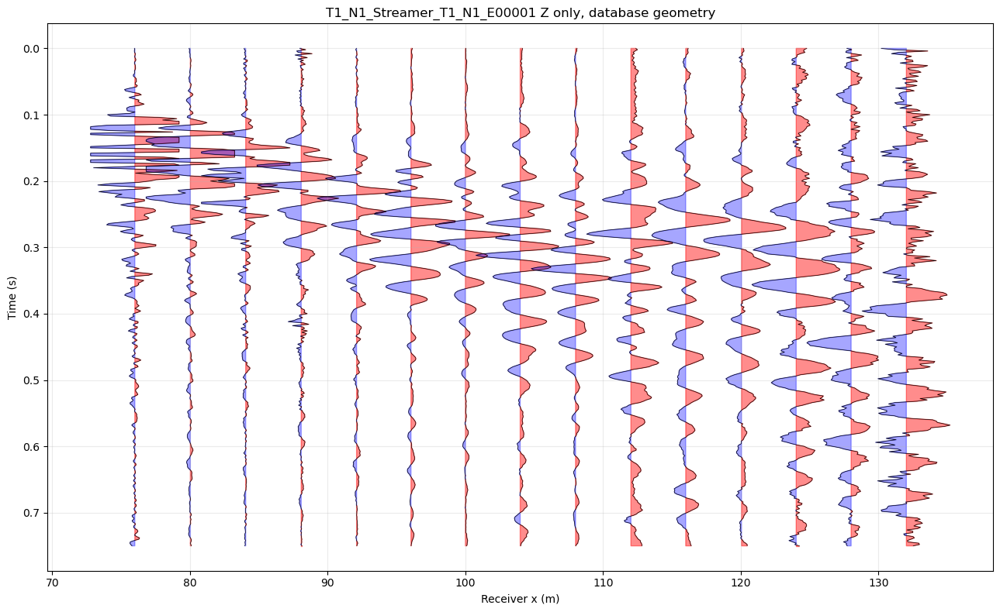

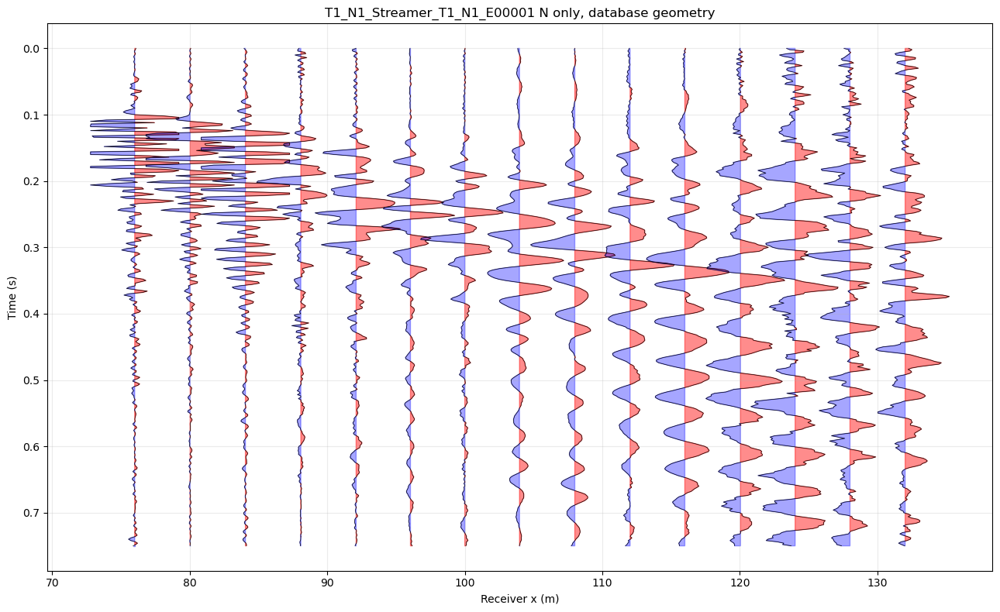

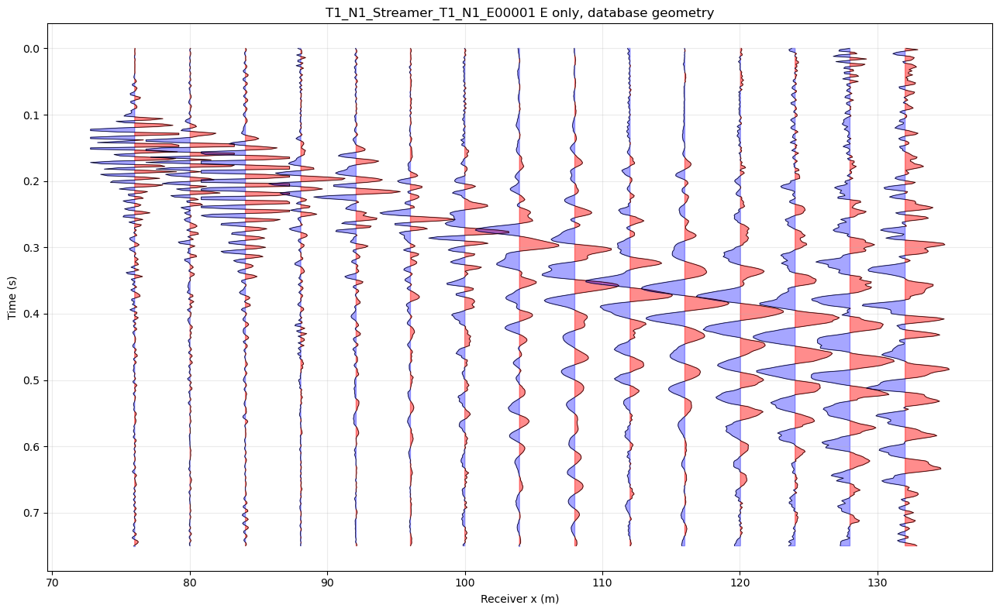

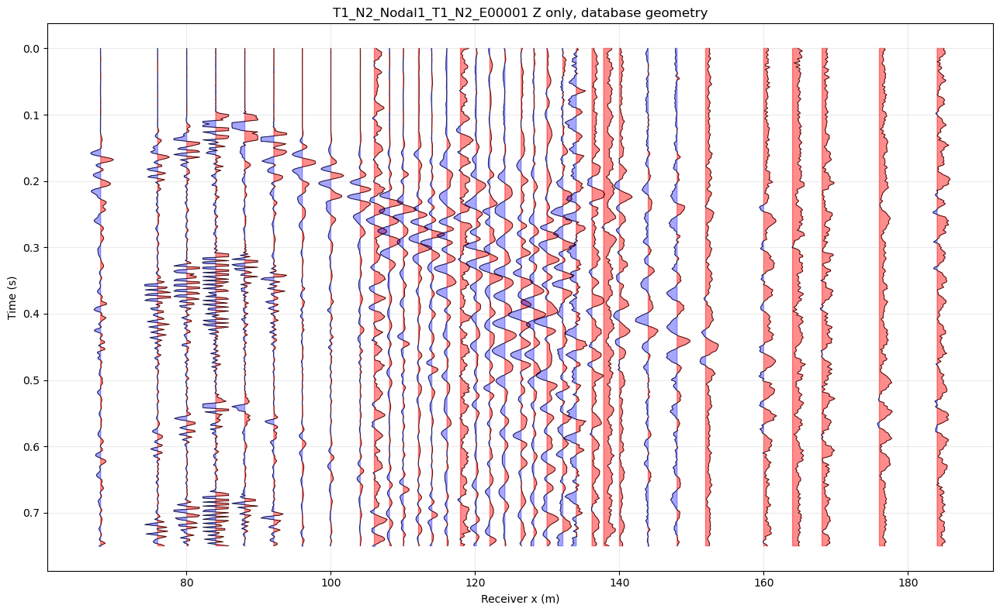

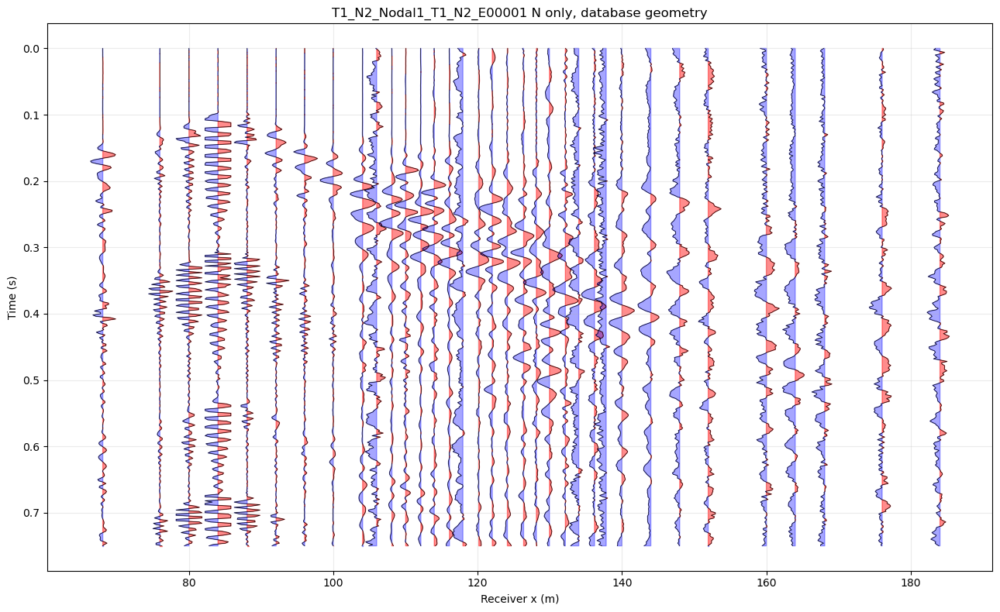

...

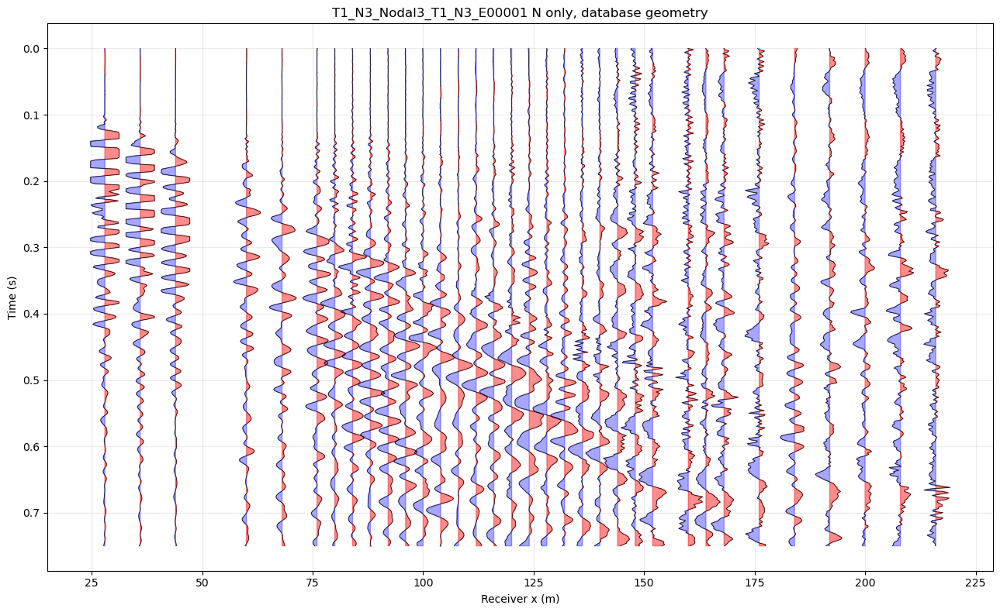

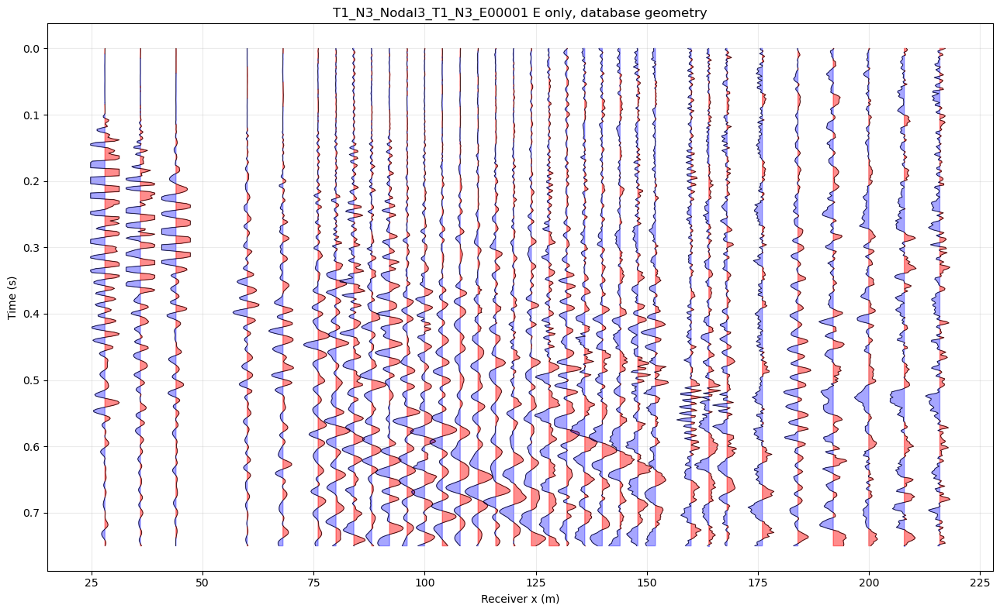

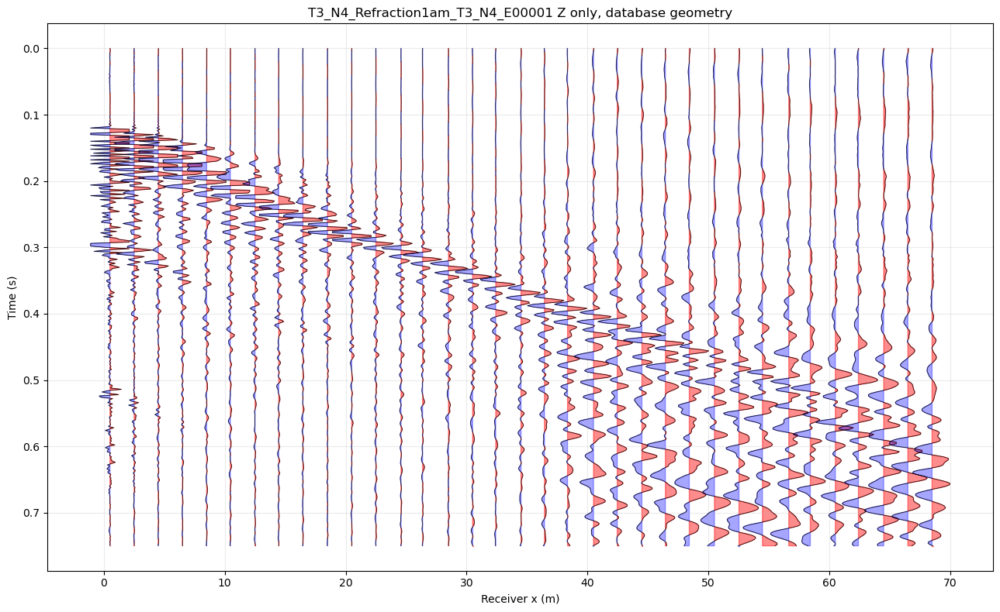

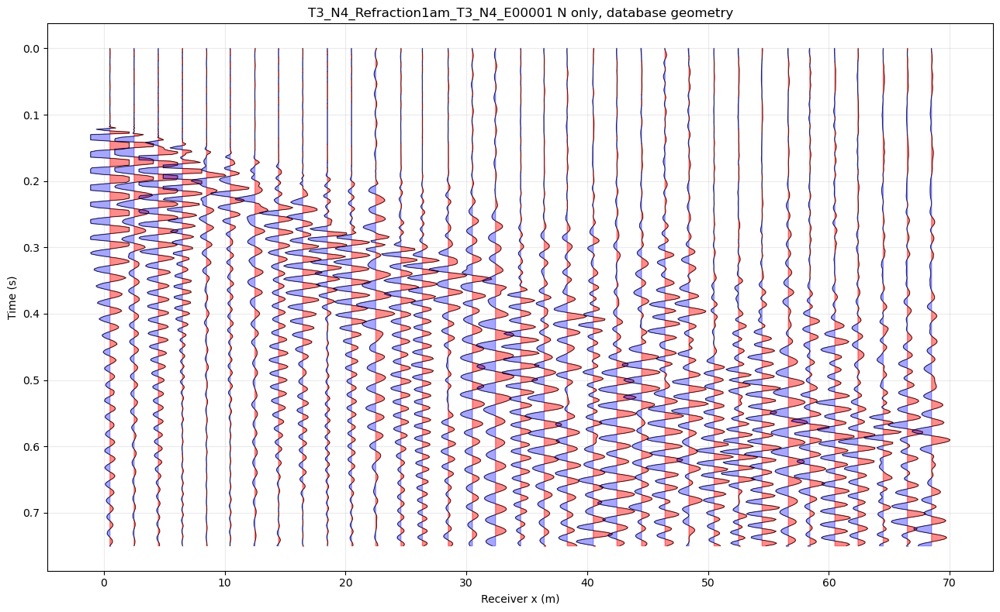

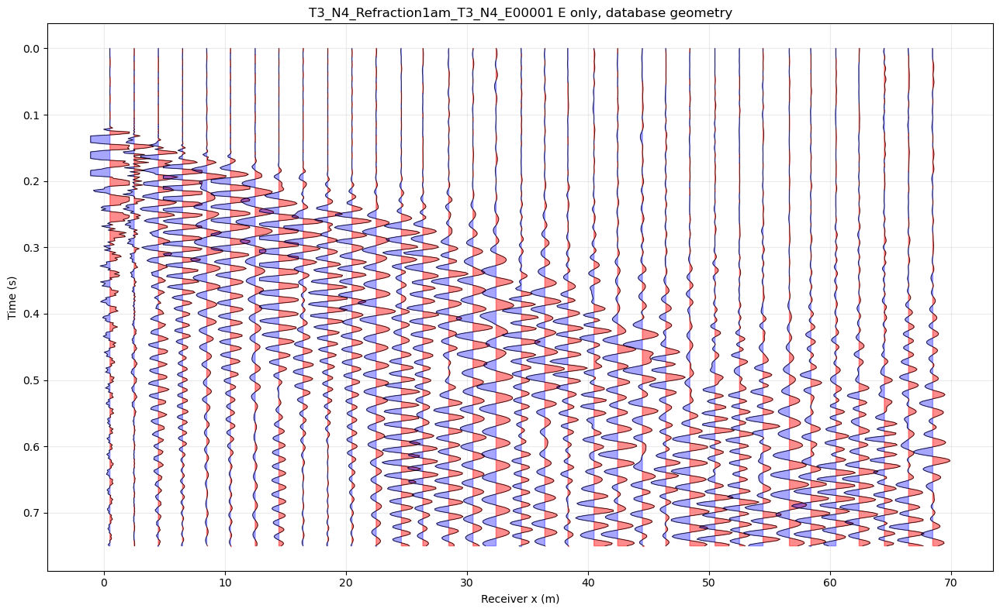

In [16]:
import sys
from pathlib import Path

# Adjust these if the notebook is not run from the repo tree.
for candidate in [Path("../lib").resolve(), Path("../../lib").resolve(), Path("lib").resolve()]:
    if candidate.exists() and str(candidate) not in sys.path:
        sys.path.insert(0, str(candidate))

try:
    from segy_tools.gather import plot_wiggle_gather_from_stream
    HAVE_SEGY_TOOLS = True
except Exception as e:
    print("Could not import segy_tools.gather:", e)
    HAVE_SEGY_TOOLS = False


def _seed_id_from_trace(tr):
    return f"{tr.stats.network}.{tr.stats.station}.{tr.stats.location}.{tr.stats.channel}"


def attach_geometry_from_trace_index(st, event_id, component="Z"):
    """
    Return a one-component copy of `st` with tr.stats.receiver_x_m attached from
    the catalog trace_index table.

    This is needed because MiniSEED does not reliably carry receiver geometry.
    The wiggle plotting code should then use tr.stats.receiver_x_m rather than
    falling back to trace number or fixed receiver spacing.
    """
    geom = trace_index[trace_index["event_id"].astype(str) == str(event_id)].copy()

    if component:
        geom = geom[geom["channel"].astype(str).str.endswith(component)].copy()

    geom["receiver_x_m"] = pd.to_numeric(geom["receiver_x_m"], errors="coerce")
    geom = geom.dropna(subset=["receiver_x_m"])

    # Build several possible lookup keys, since catalog schemas vary slightly.
    x_lookup = {}
    for _, r in geom.iterrows():
        station = str(r.get("station", ""))
        channel = str(r.get("channel", ""))
        network = str(r.get("network", "")) if "network" in geom.columns else ""
        location = str(r.get("location", "")) if "location" in geom.columns else ""
        x = float(r["receiver_x_m"])

        for key in [
            r.get("seed_id", None),
            f"{network}.{station}.{location}.{channel}",
            f"{station}.{channel}",
            (station, channel),
        ]:
            if key is not None:
                x_lookup[key] = x

    st_component = st.select(channel=f"*{component}").copy() if component else st.copy()

    missing = []
    for tr in st_component:
        keys = [
            _seed_id_from_trace(tr),
            f"{tr.stats.station}.{tr.stats.channel}",
            (tr.stats.station, tr.stats.channel),
        ]
        x = None
        for key in keys:
            if key in x_lookup:
                x = x_lookup[key]
                break
        if x is None:
            missing.append(_seed_id_from_trace(tr))
        else:
            tr.stats.receiver_x_m = float(x)

    if missing:
        print(f"Warning: no receiver_x_m found for {len(missing)} traces. First few: {missing[:5]}")

    return st_component


def simple_geometry_aware_wiggle(st, title="", tmin=0.0, tmax=0.75, scale=0.8, normalize=True):
    """Fallback wiggle plot that uses tr.stats.receiver_x_m explicitly."""
    traces = []
    for tr in st:
        if not hasattr(tr.stats, "receiver_x_m"):
            continue
        x = float(tr.stats.receiver_x_m)
        dt = float(tr.stats.delta)
        n = tr.stats.npts
        t = np.arange(n) * dt
        i1 = max(0, int(round(tmin / dt)))
        i2 = min(n, int(round(tmax / dt)))
        if i2 <= i1:
            continue
        y = tr.data[i1:i2].astype(float)
        y = y - np.nanmedian(y)
        tt = t[i1:i2]
        traces.append((x, tt, y, tr.id))

    if not traces:
        print("No traces with receiver_x_m to plot.")
        return

    traces = sorted(traces, key=lambda item: item[0])
    xs = np.array([x for x, _, _, _ in traces], dtype=float)
    dx = np.nanmedian(np.diff(np.unique(xs))) if len(np.unique(xs)) > 1 else 1.0
    if not np.isfinite(dx) or dx <= 0:
        dx = 1.0

    fig, ax = plt.subplots(figsize=(12, 6))
    for x, tt, y, trace_id in traces:
        amp = y.copy()
        if normalize:
            m = np.nanmax(np.abs(amp))
            if np.isfinite(m) and m > 0:
                amp = amp / m
        amp = amp * scale * dx
        ax.plot(x + amp, tt, lw=0.6, color="k")
        ax.fill_betweenx(tt, x, x + np.maximum(amp, 0), alpha=0.35)

    ax.invert_yaxis()
    ax.set_xlabel("Receiver x (m)")
    ax.set_ylabel("Time (s)")
    ax.set_title(title)
    ax.grid(True, alpha=0.25)
    plt.tight_layout()
    plt.show()


# Pick one representative MiniSEED gather from each time window.
mseed_files2 = mseed_files.drop(
    columns=["timewindow_label", "event_time_dt"],
    errors="ignore",
).merge(
    shot_events[["event_id", "timewindow_label", "event_time_dt"]],
    on="event_id",
    how="left",
)

example_mseed = (
    mseed_files2
    .sort_values(["timewindow_label", "event_time_dt"], na_position="last")
    .groupby("timewindow_label", dropna=False)
    .head(1)
)

display(example_mseed[["event_id", "timewindow_label", "file_path"]])

for _, row in example_mseed.iterrows():
    event_id = row["event_id"]
    p = Path(row["file_path"])
    print("\n", row["timewindow_label"], event_id, p)
    if not p.exists():
        print("missing")
        continue

    st = read(str(p))
    print(st)

    # Show catalog geometry summary for this event, by component.
    ti = trace_index[trace_index["event_id"].astype(str) == str(event_id)].copy()
    if len(ti):
        ti["receiver_x_m"] = pd.to_numeric(ti["receiver_x_m"], errors="coerce")
        display(
            ti.groupby("channel")["receiver_x_m"]
              .agg(["count", "min", "max"])
              .reset_index()
        )

    for component in ["Z", "N", "E"]:  # Change to ["Z", "N", "E"] if you want all components separately.
        stc = attach_geometry_from_trace_index(st, event_id, component=component)
        xs = [getattr(tr.stats, "receiver_x_m", np.nan) for tr in stc]
        xs = [x for x in xs if np.isfinite(x)]
        print(f"{component} traces:", len(stc), "with geometry:", len(xs))
        if xs:
            print(f"{component} receiver x range: {min(xs):.2f} to {max(xs):.2f} m")

        if HAVE_SEGY_TOOLS:
            try:
                plot_wiggle_gather_from_stream(
                    stc,
                    component=component,
                    sort_by="receiver_x",
                    title=f"{event_id} {component} only, database geometry",
                    tmin=0.0,
                    tmax=0.75,
                    scale=0.8,
                    clip_percentile=99,
                    normalize=True,
                )
                continue
            except TypeError:
                # Older segy_tools.gather did not accept component=.
                try:
                    plot_wiggle_gather_from_stream(
                        stc,
                        sort_by="receiver_x",
                        title=f"{event_id} {component} only, database geometry",
                        tmin=0.0,
                        tmax=0.75,
                        scale=0.8,
                        clip_percentile=99,
                        normalize=True,
                    )
                    continue
                except Exception as e:
                    print("segy_tools plot failed; using fallback:", e)
            except Exception as e:
                print("segy_tools plot failed; using fallback:", e)

        simple_geometry_aware_wiggle(
            stc,
            title=f"{event_id} {component} only, database geometry",
            tmin=0.0,
            tmax=0.75,
            scale=0.8,
            normalize=True,
        )

## 15. Export compact QC package

In [15]:
print("QC exports written to:")
print(QC_OUT)

for p in sorted(QC_OUT.glob("*.csv")):
    print(p.name, p.stat().st_size, "bytes")

QC exports written to:
/Volumes/tachyon/LBSSP_DATA/nodal_fullnode_shotgathers_v4/qc_exports
._consensus_picks_by_event.csv 4096 bytes
._event_summary_by_timewindow.csv 4096 bytes
._first_pick_times_by_event.csv 4096 bytes
._missing_shot_gather_files.csv 4096 bytes
._pick_summary.csv 4096 bytes
._receiver_geometry_summary.csv 4096 bytes
._refapy_readiness_summary.csv 4096 bytes
._shot_gather_file_summary.csv 4096 bytes
._trace_counts_by_event.csv 4096 bytes
consensus_picks_by_event.csv 296497 bytes
event_summary_by_timewindow.csv 810 bytes
first_pick_times_by_event.csv 405865 bytes
missing_shot_gather_files.csv 255 bytes
pick_summary.csv 1105 bytes
receiver_geometry_summary.csv 481 bytes
refapy_readiness_summary.csv 127 bytes
shot_gather_file_summary.csv 309 bytes
trace_counts_by_event.csv 332190 bytes
